In [17]:
import pandas as pd
import numpy as np

df = pd.read_csv("data/bdc_us_fixed_broadband_summary_by_geography_D24_27may2025.csv")
df.head()

/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_23378/991470049.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/bdc_us_fixed_broadband_summary_by_geography_D24_27may2025.csv")


,area_data_type,geography_type,geography_id,geography_desc,geography_desc_full,total_units,biz_res,technology,speed_02_02,speed_10_1,speed_25_3,speed_100_20,speed_250_25,speed_1000_100
0,Total,National,99,National,National,164620769,R,Any Technology,1.000000,1.000000,1.000000,0.999915,0.913461,0.591072
1,Total,National,99,National,National,164620769,B,Any Technology,1.000000,1.000000,1.000000,0.993139,0.746524,0.501278
2,Total,National,99,National,National,164620769,R,All Wired,0.942106,0.931728,0.918561,0.908017,0.898754,0.583151
3,Total,National,99,National,National,164620769,B,All Wired,0.829737,0.801457,0.775443,0.728293,0.711937,0.484449
4,Total,National,99,National,National,164620769,R,Any Terrestrial,0.978961,0.971896,0.964742,0.945110,0.913461,0.591072


In [23]:
df_county = df[df["geography_type"] == "County"]
df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)
df_county = (
    df_county
    .groupby("fips", as_index=False)["speed_02_02"]
    .mean()
)
len(df_county)

/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_23378/1704637301.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)


3232

In [2]:
df = pd.read_csv("data/bdc_us_mobile_broadband_summary_by_geography_D24_27may2025.csv")
df.head()

,area_data_type,geography_type,geography_id,geography_desc,total_area,mobilebb_3g_area_st_pct,mobilebb_3g_area_iv_pct,mobilebb_4g_area_st_pct,mobilebb_4g_area_iv_pct,mobilebb_5g_spd1_area_st_pct,mobilebb_5g_spd1_area_iv_pct,mobilebb_5g_spd2_area_st_pct,mobilebb_5g_spd2_area_iv_pct
0,Total,National,99,National,9.754824e+06,0.061412,0.042772,0.687893,0.458448,0.480186,0.248546,0.371290,0.170436
1,Total,State,1,Alabama,1.370274e+05,0.000000,0.000000,0.946387,0.636515,0.619832,0.301643,0.453981,0.225157
2,Total,State,2,Alaska,1.846753e+06,0.081332,0.053745,0.074291,0.031995,0.017289,0.006168,0.008915,0.003235
3,Total,State,4,Arizona,2.573078e+05,0.070936,0.047557,0.725504,0.338257,0.390434,0.173775,0.311653,0.117987
4,Total,State,5,Arkansas,1.310934e+05,0.000000,0.000000,0.909323,0.522770,0.653088,0.312046,0.464383,0.220165


In [11]:
df_county = df[df["geography_type"] == "County"]
df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)
df_county['fips']


/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_23378/259003613.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)


57       01001
58       01003
59       01005
60       01007
61       01009
         ...  
19649    72151
19650    72153
19651    78010
19652    78020
19653    78030
Name: fips, Length: 12265, dtype: object

In [24]:
df = pd.read_csv("data/county_water_availability_full.csv")
df.head()

,county_fips,county_name,state_fips,major_rivers,tributaries,total_flow_cms,min_flow_cms,availability_score,status,recommendation
0,31039,Cuming,31,1,0,20.642947,20.642947,40.000000,Minimal flow,Hybrid cooling recommended
1,53069,Wahkiakum,53,0,0,0.000000,0.000000,0.000000,No gauge data,Cannot assess
2,35011,De Baca,35,4,0,8.701753,0.000000,58.615776,Adequate major sources,Suitable for direct cooling
3,31109,Lancaster,31,3,6,8.378658,0.004814,78.012784,Adequate major sources,Suitable for direct cooling
4,31129,Nuckolls,31,1,1,2.106770,0.993920,21.067699,Minimal flow,Hybrid cooling recommended


In [34]:
import pandas as pd
import numpy as np

def broadband_processing(df):
    # Convert 'year' to string for better handling in Altair
    df_county = df[df["geography_type"] == "County"]
    df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)
    df_county['fiber_score'] = 100 * df_county['mobilebb_4g_area_st_pct'].fillna(0)
    return df_county

def water_processing(df):
    # Convert 'year' to string for better handling in Altair
    df['fips'] = df['county_fips'].astype(str).str.zfill(5)
    df['water_score'] = df['availability_score']
    return df

def gen_random_data(df, col_name):
    N = len(df)
    # Create random data for dummy data
    new_df = pd.DataFrame({
        "fips": df['fips'],
        col_name: 100 * np.random.rand(N)
    })
    return new_df

def load_score_data():
    # Replace file paths & column names with your actual CSV/Parquet/etc. files
    df_water = water_processing(pd.read_csv("data/county_water_availability_full.csv")) # fips, water_score
    df_land = gen_random_data(df_water, "land_score")    # fips, land_score
    df_zoning = gen_random_data(df_water, "zoning_score") # fips, zoning_score
    df_fiber = broadband_processing(pd.read_csv("data/bdc_us_mobile_broadband_summary_by_geography_D24_27may2025.csv"))   # fips, fiber_score
    df_power = gen_random_data(df_water, "power_score")  # fips, power_score
    return df_water, df_land, df_zoning, df_fiber, df_power

def build_master_df(df_w, df_l, df_z, df_f, df_p):
    """
    Outer‐merge all five on 'fips' so missing counties become NaN.
    """
    df_master = (
        df_w.merge(df_l, on="fips", how="outer")
            .merge(df_z, on="fips", how="outer")
            .merge(df_f, on="fips", how="outer")
            .merge(df_p, on="fips", how="outer")
    )
    df_master["fips"] = df_master["fips"].astype(str).str.zfill(5)
    df_master = df_master[["fips", "water_score", "land_score", "zoning_score", "fiber_score", "power_score"]]
    return df_master

df_water, df_land, df_zoning, df_fiber, df_power = load_score_data()
df_master = build_master_df(df_water, df_land, df_zoning, df_fiber, df_power)
print(df_master.head())
df_master.to_csv("data/county_scores.csv", index=False)

    fips  water_score  land_score  zoning_score  fiber_score  power_score
0  01001          0.0   40.074165      7.344162    99.466667     70.27336
1  01001          0.0   40.074165      7.344162   100.000000     70.27336
2  01001          0.0   40.074165      7.344162    99.446711     70.27336
3  01001          0.0   40.074165      7.344162    99.466667     70.27336
4  01003        100.0    1.548311     82.347661    92.418743     64.20079


/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_23378/3899425858.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_county['fips'] = df_county['geography_id'].astype(str).str.zfill(5)
/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_23378/3899425858.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_county['fiber_score'] = 100 * df_county['mobilebb_4g_area_st_pct'].fillna(0)


In [36]:
df_master = pd.read_csv("data/county_scores.csv")
df_master["fips"] = df_master["fips"].astype(str).str.zfill(5)
df_master.head()

,fips,water_score,land_score,zoning_score,fiber_score,power_score
0,01001,0.0,40.074165,7.344162,99.466667,70.27336
1,01001,0.0,40.074165,7.344162,100.000000,70.27336
2,01001,0.0,40.074165,7.344162,99.446711,70.27336
3,01001,0.0,40.074165,7.344162,99.466667,70.27336
4,01003,100.0,1.548311,82.347661,92.418743,64.20079


In [23]:
import geopandas as gpd
import pandas as pd
# Replace with the path to your shapefile
CORE_MARKET_FIPS_OLD = [
    # Northern Virginia
    "51107", "51059", "51153", "51600", "51610", "51683", "51685",
    # Southern Ohio (Columbus)
    "39049", "39041", "39117", "39089", "39129",
    # Chicago area
    "17031", "17043", "17089", "17097", "17111", "17197",
    # Des Moines area
    "19153", "19121", "19135", "19181",
    # Santa Clara
    "06085", "06081", "06001", "06075",
    # Central Oregon
    "41017", "41047", "41051",
    # Denver
    "08001", "08005", "08013", "08014", "08031", "08035", "08059",
    # Kansas City
    "29095", "29037", "29165", "20091", "20103", "20121",
    # Nashville
    "47037", "47147", "47149", "47159", "47187"
]

shapefile_path = "testdata/Ohio_blockgroup/tl_2024_39_bg.shp"
paths = ["testdata/Ohio_blockgroup/tl_2024_39_bg.shp",
         "testdata/Illinois_blockgroup/tl_2024_17_bg.shp",
         "testdata/Cal_blockgroup/tl_2024_06_bg.shp",
         "testdata/Virginia_blockgroup/tl_2024_51_bg.shp",
         "testdata/Ten_blockgroup/tl_2024_47_bg.shp",
         "testdata/Iowa_blockgroup/tl_2024_19_bg.shp",
         "testdata/Colorado_blockgroup/tl_2024_08_bg.shp",
         "testdata/Kansa_blockgroup/tl_2024_20_bg.shp",
         "testdata/Oregon_blockgroup/tl_2024_41_bg.shp"]

def open_shapefile(shapefile_path):
    # Read the shapefile
    gdf = gpd.read_file(shapefile_path)
    # Add statecounty_fips field
    gdf["statecounty_fips"] = gdf["STATEFP"] + gdf["COUNTYFP"]
    # Filter to core market FIPS
    gdf = gdf[gdf["statecounty_fips"].isin(CORE_MARKET_FIPS_OLD)]
    return gdf

# Read first file
gdf_list = [open_shapefile(path) for path in paths]

# Concatenate all GeoDataFrames
gdf = pd.concat(gdf_list, ignore_index=True)

# Result
print(len(gdf))
gdf.head()


16872


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,GEOIDFQ,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,statecounty_fips
0,39,117,965401,2,391179654012,1500000US391179654012,Block Group 2,G5030,S,38035464,0,+40.5322343,-082.7200016,"POLYGON ((-82.78711 40.54447, -82.78694 40.551...",39117
1,39,117,965201,3,391179652013,1500000US391179652013,Block Group 3,G5030,S,4127901,0,+40.5575518,-082.8488061,"POLYGON ((-82.86267 40.55497, -82.86267 40.555...",39117
2,39,117,965202,1,391179652021,1500000US391179652021,Block Group 1,G5030,S,24649553,27513,+40.5210821,-082.8208315,"POLYGON ((-82.86501 40.50006, -82.86488 40.500...",39117
3,39,117,965401,1,391179654011,1500000US391179654011,Block Group 1,G5030,S,45493332,195113,+40.4939483,-082.7751895,"POLYGON ((-82.81435 40.43291, -82.81426 40.434...",39117
4,39,117,965202,2,391179652022,1500000US391179652022,Block Group 2,G5030,S,33968355,0,+40.5568879,-082.8948111,"POLYGON ((-82.95805 40.5601, -82.95802 40.5666...",39117


In [24]:
def gen_random_data(df, col_name):
    df[col_name] = 100 * np.random.rand(len(df))
    return df

gdf = gen_random_data(gdf, "climate factors_score")
gdf = gen_random_data(gdf, "future scalability_score")
gdf = gen_random_data(gdf, "regulations_score")
gdf = gen_random_data(gdf, "land_score")
gdf = gen_random_data(gdf, "zoning_score")
gdf = gen_random_data(gdf, "fiber_score")
gdf = gen_random_data(gdf, "power_score")

In [25]:
import geopandas as gpd
gdf.to_file('core_markets_blockgroup.geojson', driver='GeoJSON')  
#gdf = gpd.read_file('core_markets_blockgroup.geojson')
#gdf.columns

In [3]:
CORE_MARKET_FIPS_DICT = {
    "Northern Virginia": [
        "51107", "51059", "51153", "51600", "51610", "51683", "51685"
    ],
    "Southern Ohio (Columbus)": [
        "39049", "39041", "39117", "39089", "39129"
    ],
    "Chicago area": [
        "17031", "17043", "17089", "17097", "17111", "17197"
    ],
    "Des Moines area": [
        "19153", "19121", "19135", "19181"
    ],
    "Santa Clara": [
        "06085", "06081", "06001", "06075"
    ],
    "Central Oregon": [
        "41017", "41047", "41051"
    ],
    "Denver": [
        "08001", "08005", "08013", "08014", "08031", "08035", "08059"
    ],
    "Kansas City": [
        "29095", "29037", "29165", "20091", "20103", "20121"
    ],
    "Nashville": [
        "47037", "47147", "47149", "47159", "47187"
    ]
}

In [6]:
columb_gdf_proj.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,GEOIDFQ,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,statecounty_fips,water_score,land_score,zoning_score,fiber_score,power_score,geometry
0,39,117,965401,2,391179654012,1500000US391179654012,Block Group 2,G5030,S,38035464,0,+40.5322343,-082.7200016,39117,74.240983,76.274791,97.495965,80.862649,6.592359,"POLYGON ((-9215819.041 4945381.952, -9215799.7..."
1,39,117,965201,3,391179652013,1500000US391179652013,Block Group 3,G5030,S,4127901,0,+40.5575518,-082.8488061,39117,59.643812,21.161566,14.163747,93.537503,74.963514,"POLYGON ((-9224230.119 4946920.092, -9224229.8..."
2,39,117,965202,1,391179652021,1500000US391179652021,Block Group 1,G5030,S,24649553,27513,+40.5210821,-082.8208315,39117,39.629192,29.507857,17.317822,99.070807,17.181511,"POLYGON ((-9224491.163 4938877.959, -9224476.6..."
3,39,117,965401,1,391179654011,1500000US391179654011,Block Group 1,G5030,S,45493332,195113,+40.4939483,-082.7751895,39117,21.411711,88.743124,20.190945,44.708208,57.093174,"POLYGON ((-9218851.718 4929052.892, -9218841.4..."
4,39,117,965202,2,391179652022,1500000US391179652022,Block Group 2,G5030,S,33968355,0,+40.5568879,-082.8948111,39117,22.231282,92.673260,83.204684,22.540126,62.321539,"POLYGON ((-9234848.106 4947671.303, -9234844.5..."


In [16]:
import plotly.express as px
import plotly.io as pio

pio.renderers.default = 'notebook' 
# Project to EPSG:3857 for correct centroid calculation
# Project to EPSG:3857 for correct centroid calculation
columb_gdf_proj = gdf[gdf['statecounty_fips'].isin(CORE_MARKET_FIPS_DICT["Southern Ohio (Columbus)"])]
#columb_gdf_proj = filter_master_df(columb_gdf_proj, thresholds)
# Clean invalid geometries
columb_gdf_proj = columb_gdf_proj.to_crs(epsg=4326)

# Use projected centroid and convert back to EPSG:4326
center = {
    "lat": columb_gdf_proj.geometry.centroid.to_crs(epsg=4326).y.mean(),
    "lon": columb_gdf_proj.geometry.centroid.to_crs(epsg=4326).x.mean()
}

import json

geojson = json.loads(columb_gdf_proj.to_json())

fig = px.choropleth_mapbox(
    columb_gdf_proj,
    geojson=geojson,
    locations=columb_gdf_proj.index.astype(str),   # match GeoJSON "id"
    featureidkey="id",                             # tell Plotly to use "id"
    color="power_score",
    mapbox_style="open-street-map",
    center=center,
    zoom=9,
    opacity=0.6,
    height=600
)

fig.update_layout(
    margin={"r":0,"t":30,"l":0,"b":0},
    title="Southern Ohio (Columbus) - Power Score"
)

fig.show()

/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_84401/1498238574.py:14: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_84401/1498238574.py:15: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_84401/1498238574.py:22: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [18]:
import numpy as np
def filter_master_df(df, thresholds: dict):
    """
    Return a new DataFrame in which each 'fips' row passes
    ALL of the thresholds in the dictionary.
    thresholds: {"water_score": 80, "land_score": 70, ...}
    """
    df["passes"] = 1
    print(thresholds)
    for col, min_val in thresholds.items():
        # Any row where col < min_val (or is NaN) should be marked 0
        mask_fails = df[col].fillna(-1) < min_val
        df.loc[mask_fails, "passes"] = np.nan
    return df

df2 = filter_master_df(columb_gdf_proj, {"power_score":60})
df2.head()

{'power_score': 60}


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,GEOIDFQ,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,INTPTLAT,INTPTLON,statecounty_fips,water_score,land_score,zoning_score,fiber_score,power_score,geometry,passes
0,39,117,965401,2,391179654012,1500000US391179654012,Block Group 2,G5030,S,38035464,...,+40.5322343,-082.7200016,39117,74.240983,76.274791,97.495965,80.862649,6.592359,"POLYGON ((-82.78711 40.54447, -82.78694 40.551...",NaN
1,39,117,965201,3,391179652013,1500000US391179652013,Block Group 3,G5030,S,4127901,...,+40.5575518,-082.8488061,39117,59.643812,21.161566,14.163747,93.537503,74.963514,"POLYGON ((-82.86267 40.55497, -82.86267 40.555...",1.0
2,39,117,965202,1,391179652021,1500000US391179652021,Block Group 1,G5030,S,24649553,...,+40.5210821,-082.8208315,39117,39.629192,29.507857,17.317822,99.070807,17.181511,"POLYGON ((-82.86501 40.50006, -82.86488 40.500...",NaN
3,39,117,965401,1,391179654011,1500000US391179654011,Block Group 1,G5030,S,45493332,...,+40.4939483,-082.7751895,39117,21.411711,88.743124,20.190945,44.708208,57.093174,"POLYGON ((-82.81435 40.43291, -82.81426 40.434...",NaN
4,39,117,965202,2,391179652022,1500000US391179652022,Block Group 2,G5030,S,33968355,...,+40.5568879,-082.8948111,39117,22.231282,92.673260,83.204684,22.540126,62.321539,"POLYGON ((-82.95805 40.5601, -82.95802 40.5666...",1.0


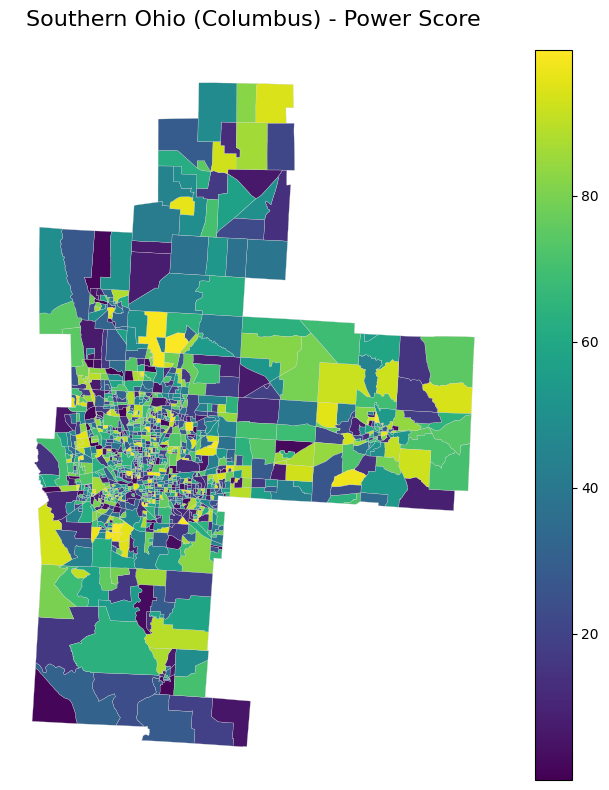

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Filter to region
columb_gdf_proj = gdf[gdf['statecounty_fips'].isin(CORE_MARKET_FIPS_DICT["Southern Ohio (Columbus)"])]
# If necessary:
# columb_gdf_proj = filter_master_df(columb_gdf_proj, thresholds)

# Project for good display — or just use default CRS if already in EPSG:4326
# EPSG:3857 is good if you plan to overlay with OSM later
columb_gdf_proj = columb_gdf_proj.to_crs(epsg=3857)

# Plot with GeoPandas' built-in plotting (static choropleth)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

columb_gdf_proj.plot(
    column='power_score',        # The column you want to color by
    cmap='viridis',              # Colormap
    linewidth=0.2,               # Thin borders
    edgecolor='lightgray',
    legend=True,                 # Show legend
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "lightgray",
        "hatch": "///",
        "label": "Missing Data"
    }
)

# Optional: set limits if you want to zoom
# ax.set_xlim(...)
# ax.set_ylim(...)

ax.set_title("Southern Ohio (Columbus) - Power Score", fontsize=16)
ax.set_axis_off()

plt.tight_layout()
plt.show()


In [9]:
import json

geojson = gdf.__geo_interface__

# Inspect first feature
print(json.dumps(geojson['features'][0], indent=2))

{
  "id": "0",
  "type": "Feature",
  "properties": {
    "STATEFP": "39",
    "COUNTYFP": "117",
    "TRACTCE": "965401",
    "BLKGRPCE": "2",
    "GEOID": "391179654012",
    "GEOIDFQ": "1500000US391179654012",
    "NAMELSAD": "Block Group 2",
    "MTFCC": "G5030",
    "FUNCSTAT": "S",
    "ALAND": 38035464,
    "AWATER": 0,
    "INTPTLAT": "+40.5322343",
    "INTPTLON": "-082.7200016",
    "statecounty_fips": "39117",
    "water_score": 74.2409827506328,
    "land_score": 76.27479101895328,
    "zoning_score": 97.49596534959444,
    "fiber_score": 80.86264881329312,
    "power_score": 6.592359499254508
  },
  "geometry": {
    "type": "Polygon",
    "coordinates": [
      [
        [
          -82.787111,
          40.544473
        ],
        [
          -82.786938,
          40.551932
        ],
        [
          -82.777403,
          40.551876
        ],
        [
          -82.775229,
          40.551783
        ],
        [
          -82.767917,
          40.55163
        ],


In [ ]:
GRID_STATUS_LAT_LON_DICT = {
    "GridRealTimeLMP_Chicago_2023.csv": (41.878, -87.629),
    "GridRealTimeLMP_Atlanta_2023.csv": (33.749, -84.388),
    "GridRealTimeLMP_Austin_2023.csv": (30.267, -97.743),
    "GridRealTimeLMP_Carolinas_2023.csv": (35.227, -80.843),
    "GridRealTimeLMP_Dallas_2023.csv": (32.776, -96.797),
    "GridRealTimeLMP_DesMoines_2023.csv": (41.586, -93.625),
    "GridRealTimeLMP_HalfMoonBay_2023.csv": (37.464, -122.428),
    "GridRealTimeLMP_Indianapolis_2023.csv": (39.768, -86.158),
    "GridRealTimeLMP_KansasCity_2023.csv": (39.099, -94.578),
    "GridRealTimeLMP_LasVegas_2023.csv": (36.169, -115.139),
    "GridRealTimeLMP_Minneapolis_2023.csv": (44.977, -93.265),
    "GridRealTimeLMP_Newark_2023.csv": (40.735, -74.172),
    "GridRealTimeLMP_Omaha_2023.csv": (41.256, -95.934),
    "GridRealTimeLMP_SanAntonio_2023.csv": (29.424, -98.493),
    "GridRealTimeLMP_SanFrancisco_2023.csv": (37.774, -122.419),
    "GridRealTimeLMP_Virginia_2023.csv": (37.432, -78.657),  
    "GridRealTimeLMP_Wenatchee_2023.csv": (47.423, -120.310),
}

In [8]:
# Grid status data testing:
import pandas as pd
import os
base_path = "testdata/GridStatus_LMP"
dfs = []
for filename in os.listdir(base_path):
    if filename.endswith(".csv"):
        lat, lon = LAT_LON_DICT.get(filename, (None, None))
        if lat is not None and lon is not None:
            df = pd.read_csv(os.path.join(base_path, filename))
            df['latitude'] = lat
            df['longitude'] = lon
            print(f"Processed {filename} with lat={lat}, lon={lon}")
            dfs.append(df)
        else:
            print(f"Skipping {filename}, no coordinates found.")
df.head()

Processed GridRealTimeLMP_Indianapolis_2023.csv with lat=39.768, lon=-86.158
Processed GridRealTimeLMP_Newark_2023.csv with lat=40.735, lon=-74.172
Processed GridRealTimeLMP_Wenatchee_2023.csv with lat=47.423, lon=-120.31
Processed GridRealTimeLMP_HalfMoonBay_2023.csv with lat=37.464, lon=-122.428
Processed GridRealTimeLMP_Atlanta_2023.csv with lat=33.749, lon=-84.388
Processed GridRealTimeLMP_Dallas_2023.csv with lat=32.776, lon=-96.797
Processed GridRealTimeLMP_Austin_2023.csv with lat=30.267, lon=-97.743
Processed GridRealTimeLMP_Omaha_2023.csv with lat=41.256, lon=-95.934
Processed GridRealTimeLMP_DesMoines_2023.csv with lat=41.586, lon=-93.625
Processed GridRealTimeLMP_Chicago_2023.csv with lat=41.878, lon=-87.629
Processed GridRealTimeLMP_Carolinas_2023.csv with lat=35.227, lon=-80.843
Skipping GridRealTimeLMP_Columbus_2023.csv, no coordinates found.
Processed GridRealTimeLMP_SanFrancisco_2023.csv with lat=37.774, lon=-122.419
Processed GridRealTimeLMP_Virginia_2023.csv with lat=

,interval_start_local,interval_start_utc,interval_end_local,interval_end_utc,location,lmp,energy,congestion,loss,ghg,latitude,longitude
0,2023-01-01T00:00:00-08:00,2023-01-01 08:00:00+00:00,2023-01-01T01:00:00-08:00,2023-01-01 09:00:00+00:00,SPECTRUM_GNODEIT,105.408800,114.527500,-0.0012,0.000000,-9.117500,36.169,-115.139
1,2023-01-01T01:00:00-08:00,2023-01-01 09:00:00+00:00,2023-01-01T02:00:00-08:00,2023-01-01 10:00:00+00:00,SPECTRUM_GNODEIT,98.206545,109.744930,-0.0012,-0.551885,-10.985300,36.169,-115.139
2,2023-01-01T02:00:00-08:00,2023-01-01 10:00:00+00:00,2023-01-01T03:00:00-08:00,2023-01-01 11:00:00+00:00,SPECTRUM_GNODEIT,98.330900,103.688910,-0.0012,0.000000,-5.356810,36.169,-115.139
3,2023-01-01T03:00:00-08:00,2023-01-01 11:00:00+00:00,2023-01-01T04:00:00-08:00,2023-01-01 12:00:00+00:00,SPECTRUM_GNODEIT,98.928200,107.865887,-0.0012,0.000000,-8.936488,36.169,-115.139
4,2023-01-01T04:00:00-08:00,2023-01-01 12:00:00+00:00,2023-01-01T05:00:00-08:00,2023-01-01 13:00:00+00:00,SPECTRUM_GNODEIT,99.997600,109.351300,-0.0012,0.000000,-9.352500,36.169,-115.139


In [10]:
# 1) Imports
import pandas as pd
import plotly.express as px
from ipywidgets import interact, DatePicker, IntSlider

# ----------------------------------------------------------------
# 2) Suppose you have multiple DataFrames already loaded:
#    Each one must have:
#      ['latitude','longitude','lmp',
#       'interval_start_local','interval_start_utc',
#       'interval_end_local','interval_end_utc']
# ----------------------------------------------------------------

# parse timestamps in each DF
for df in dfs:
    # local intervals (pandas infers the offset like “-05:00”)
    df['interval_start_local'] = pd.to_datetime(df['interval_start_local'])
    df['interval_end_local']   = pd.to_datetime(df['interval_end_local'])
    # UTC intervals
    df['interval_start_utc'] = pd.to_datetime(df['interval_start_utc'], utc=True)
    df['interval_end_utc']   = pd.to_datetime(df['interval_end_utc'],   utc=True)

# concatenate into one master DataFrame
df_all = pd.concat(dfs, ignore_index=True)

# ----------------------------------------------------------------
# 3) Filtering + plotting function (works exactly as before)
# ----------------------------------------------------------------
def plot_for_timestamp(selected_ts):
    mask = (
        (df_all['interval_start_utc'] <= selected_ts) &
        (selected_ts <  df_all['interval_end_utc'])
    )
    hourly = df_all.loc[mask]
    if hourly.empty:
        print(f"No data for {selected_ts.isoformat()}")
        return

    fig = px.scatter_mapbox(
        hourly,
        lat="latitude", lon="longitude",
        color="lmp",
        color_continuous_scale="Turbo",
        size_max=8,
        zoom=4,
        mapbox_style="open-street-map",
        hover_data={
            "lmp":":.2f",
            "interval_start_local":True,
            "interval_end_local":True,
            "interval_start_utc":True,
            "interval_end_utc":True
        },
        title=f"LMPs for interval containing {selected_ts.isoformat()}"
    )
    fig.update_layout(height=600)
    fig.show()

# ----------------------------------------------------------------
# 4a) Manual test
# ----------------------------------------------------------------
sel_date = pd.Timestamp("2023-01-01").date()
sel_hour = 5
selected_ts = pd.Timestamp(sel_date) + pd.Timedelta(hours=sel_hour)
selected_ts = selected_ts.tz_localize("UTC")
plot_for_timestamp(selected_ts)

# ----------------------------------------------------------------
# 4b) Interactive picker
# ----------------------------------------------------------------
def picker(date, hour):
    ts = pd.Timestamp(date) + pd.Timedelta(hours=hour)
    ts = ts.tz_localize("UTC")
    plot_for_timestamp(ts)

interact(
    picker,
    date=DatePicker(value=pd.Timestamp("2023-01-01").date(), description="Date"),
    hour=IntSlider(min=0, max=23, step=1, value=0, description="Hour (UTC)")
)


/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_43568/226026771.py:17: FutureWarning:

In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`

/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_43568/226026771.py:18: FutureWarning:

In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`

/var/folders/pv/386_wnhs3kn06cp1zjbsczv00000gq/T/ipykernel_43568/226026771.py:17: FutureWarning:

In a future version of pandas, parsing datetimes with mixed time zones will raise an error unl

interactive(children=(DatePicker(value=datetime.date(2023, 1, 1), description='Date', step=1), IntSlider(value…

<function __main__.picker(date, hour)>

In [11]:
OUT_PATH = "data/gridstatus_lmp_samples.parquet"
os.makedirs(os.path.dirname(OUT_PATH), exist_ok=True)
df_all.to_parquet(OUT_PATH, index=False)
print(f"Wrote {len(df_all)} rows to {OUT_PATH}")

Wrote 141726 rows to data/gridstatus_lmp_samples.parquet


In [25]:
# 1️⃣  Install/Import --------------------------------------------------
# !pip install geopandas folium contextily --quiet   # ← uncomment if needed
# 1️⃣  Install / import  ───────────────────────────────────────────────
# Uncomment the next line once if GeoPandas isn't installed
# !pip install geopandas contextily --quiet

import pathlib
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx          # <-- only if you want a basemap

geojson_path = pathlib.Path("testdata/synthetic_us_longhaul_fiber_dense.geojson")
gdf = gpd.read_file(geojson_path)

# Split for styling
nodes  = gdf[gdf["type"] == "Node"]
routes = gdf[gdf["type"] == "Long-haul"]

print(f"{len(nodes)} nodes | {len(routes)} routes")
gdf.head()

73 nodes | 80 routes


,node_name,route_id,endpoints,type,geometry
0,Seattle,None,None,Node,POINT (-122.3321 47.6062)
1,Olympia,None,None,Node,POINT (-122.9007 47.0379)
2,Spokane,None,None,Node,POINT (-117.426 47.6588)
3,Portland,None,None,Node,POINT (-122.6784 45.5152)
4,Boise,None,None,Node,POINT (-116.2023 43.615)


In [21]:
routes = gdf[gdf.geometry.type.isin(["LineString", "MultiLineString"])]
nodes  = gdf[gdf.geometry.type == "Point"]

print(f"{len(nodes)} nodes  |  {len(routes)} routes")        # ➞ should show both 'Point' and 'LineString'

20 nodes  |  24 routes


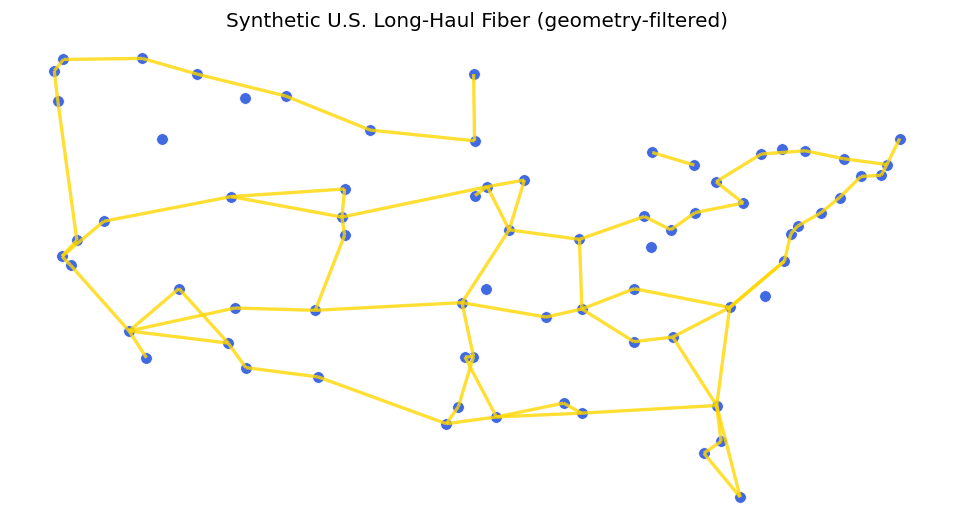

In [26]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Geometry-based split
routes = gdf[gdf.geometry.type.isin(["LineString", "MultiLineString"])]
nodes  = gdf[gdf.geometry.type == "Point"]

fig, ax = plt.subplots(figsize=(10, 7), dpi=120)
routes.plot(ax=ax, linewidth=2, color="gold", alpha=0.8)
nodes.plot(ax=ax,  markersize=50, color="royalblue",
           edgecolor="white", linewidth=0.5)
ax.set_title("Synthetic U.S. Long-Haul Fiber (geometry-filtered)")
ax.set_axis_off()
plt.show()

AttributeError: Stamen

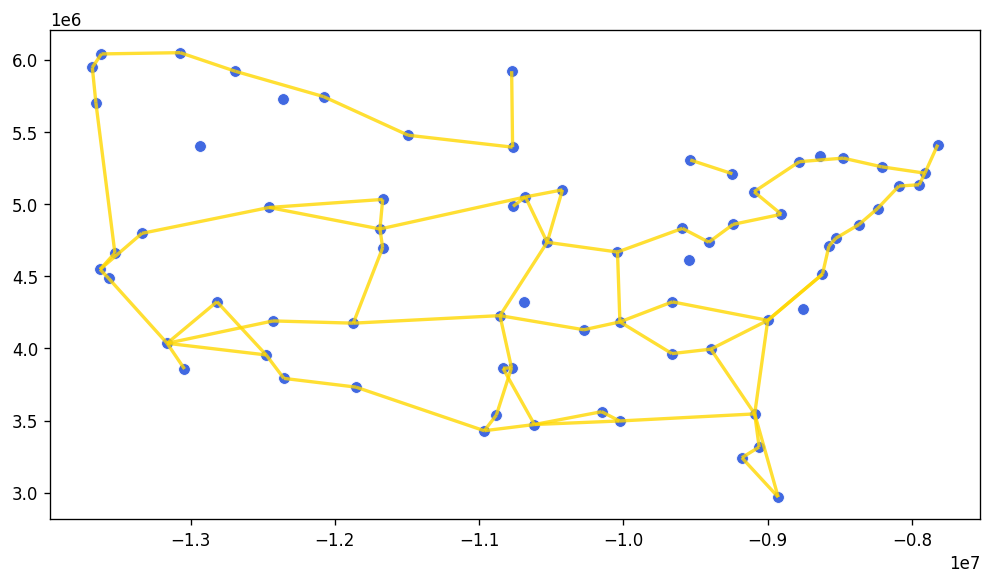

In [ ]:
# 4️⃣  OPTIONAL: add a subtle basemap  ────────────────────────────────
#    (Requires contextily; comment out if you want *no* background.)
fig, ax = plt.subplots(figsize=(10, 7), dpi=120)

routes.to_crs(epsg=3857).plot(ax=ax, linewidth=2, color="gold", alpha=0.8)
nodes.to_crs(epsg=3857).plot(ax=ax, markersize=50, color="royalblue",
                             edgecolor="white", linewidth=0.5)

# Add Stamen-terrain tiles; you can switch to "cartodb positron" etc.
cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik, zoom=4)

ax.set_axis_off()
plt.show()